# DeepLinc

- **Creator**: Sebastian Birk (<sebastian.birk@helmholtz-munich.de>).
- **Affiliation:** Helmholtz Munich, Institute of Computational Biology (ICB), Talavera-López Lab
- **Date of Creation:** 05.01.2023
- **Date of Last Modification:** 23.02.2023

- The DeepLinc source code is available at https://github.com/xryanglab/DeepLinc.
- The corresponding publication is "Li, R. & Yang, X. De novo reconstruction of cell interaction landscapes from single-cell spatial transcriptome data with DeepLinc. Genome Biol. 23, 124 (2022)".
- The logic to run DeepLinc is encapsulated into the Python script 'deeplinc.py' in the 'root/scripts' folder.
- We train DeepLinc models on the benchmarking datasets with different adjacency matrices corresponding to 4, 8, 12, 16, and 20 average neighbors.
- We compute 2 runs per number of average neighbors resulting in a total of 10 runs. Each of the 2 runs uses a different random seed (seed 0 and seed 1).
- To train a DeepLinc model with 4 average neighbors, open a terminal, navigate to the 'root/scripts' folder, and run ```python deeplinc.py -e ../datasets/srt_data/gold/seqfish_mouse_organogenesis_embryo2_counts.csv -a ../datasets/srt_data/gold/seqfish_mouse_organogenesis_embryo2_adj4.csv -c ../datasets/srt_data/gold/seqfish_mouse_organogenesis_embryo2_coords.csv -r ../datasets/srt_data/gold/seqfish_mouse_organogenesis_embryo2_cell_types.csv -n run1 -i 40 --seed 0``` (after the data has been prepared further down in this notebook).
- The results of the trained DeepLinc models (latent space features & reconstructed adjacency matrices) are manually stored in ```../datasets/benchmark_data/deeplinc/{dataset}```.
- According to the instructions in the Github repo, the authors use raw counts as input to DeepLinc. Therefore, we also use raw counts.
- To define the spatial neighborhood graph, the original DeepLinc paper uses the 3 nearest neighbors of a cell as neighbors as long as their distance to the cell would fall below a threshold radius. The threshold radius is determined by plotting the distribution of cell's distances to their 3 nearest neighbors and drawing a cutoff to remove outliers. The union of all neighbors is used as final spatial neighborhood graph (the adjacency matrix is made symmetric). We use the same method but vary the number of neighbors between 4, 8, 12, 16 and 20 and do not use the threshhold radius cutoff to make the benchmarking more simple and comparable between different methods.
- Also note that a different environment with an older Python version is required to run DeepLinc ('root/deeplinc_env.yml').

## 1. Setup

### 1.1 Import Libraries

In [1]:
import csv
import os
import re
from datetime import datetime

import anndata as ad
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import squidpy as sq

### 1.2 Define Parameters

In [2]:
model_name = "deeplinc"
latent_key = f"{model_name}_latent"
leiden_resolution = 0.5 # used for Leiden clustering of latent space
random_seed = 0

### 1.3 Run Notebook Setup

In [3]:
sc.set_figure_params(figsize=(6, 6))

In [4]:
# Get time of notebook execution for timestamping saved artifacts
now = datetime.now()
current_timestamp = now.strftime("%d%m%Y_%H%M%S")

### 1.4 Configure Paths and Directories

In [5]:
data_folder_path = "../../datasets/srt_data/gold/"
figure_folder_path = f"../../figures"
benchmark_data_folder_path = "../../datasets/benchmark_data/"

## 2. Data

### 2.1 Define Data Preparation Function

In [6]:
def preprocess_data_for_deeplinc(dataset,
                                 cell_type_key):
    # Configure benchmark folder path
    benchmark_data_dataset_folder_path = f"{benchmark_data_folder_path}/{model_name}/{dataset}"
    os.makedirs(benchmark_data_dataset_folder_path, exist_ok=True)
    
    # Load data
    adata = sc.read_h5ad(data_folder_path + f"{dataset}.h5ad")

    # Create csv files to run DeepLinc
    counts_df = pd.DataFrame(adata.layers["counts"].toarray(), columns=adata.var_names)
    counts_df.to_csv(f"{benchmark_data_dataset_folder_path}/counts.csv", index=False)

    coords_df = pd.DataFrame(adata.obsm["spatial"], columns=["X", "Y"])
    coords_df.to_csv(f"{benchmark_data_dataset_folder_path}/coords.csv", index=False)

    for n_neighbors in [4, 8, 12, 16, 20]:
        # Compute spatial neighborhood graphs
        sq.gr.spatial_neighbors(adata,
                                coord_type="generic",
                                spatial_key="spatial",
                                n_neighs=n_neighbors)
        
        # Make adjacency matrix symmetric
        adj = (adata.obsp["spatial_connectivities"].maximum(
            adata.obsp["spatial_connectivities"].T))
        
        # Write the sparse matrix to a CSV file in dense format
        with open(f"{benchmark_data_dataset_folder_path}/adj{n_neighbors}.csv", "w", newline="") as csvfile:
            writer = csv.writer(csvfile)
            writer.writerow(list(range(adj.shape[0]))) # column headers
            for i in range(adj.shape[0]):
                row_data = np.repeat(0.0, adj.shape[1])
                row_data[adj.nonzero()[1][adj.nonzero()[0] == i]] = 1.0
                row_data = row_data.tolist()
                writer.writerow(row_data)

    cell_types_df = pd.DataFrame(adata.obs[cell_type_key])
    cell_types_df.rename(columns={cell_type_key: "Cell_class_name"}, inplace=True)
    cell_types_df["Cell_ID"] = np.arange(len(adata))
    cell_types_df["Cell_class_id"] = cell_types_df["Cell_class_name"].cat.codes
    cell_types_df = cell_types_df[["Cell_ID", "Cell_class_id", "Cell_class_name"]]
    cell_types_df.to_csv(f"{benchmark_data_dataset_folder_path}/cell_types.csv", index=False)

### 2.2 Preprocess Benchmarking Datasets

In [7]:
preprocess_data_for_deeplinc(dataset="seqfish_mouse_organogenesis_embryo2",
                             cell_type_key="celltype_mapped_refined")

KeyboardInterrupt: 

In [ ]:
# The adjacency matrix csv files don't fit on disk (dim n_obs x n_obs)
preprocess_data_for_deeplinc(dataset="vizgen_merfish_mouse_liver",
                             cell_type_key="Cell_Type")

In [ ]:
preprocess_data_for_deeplinc(dataset="starmap_plus_mouse_cns",
                             cell_type_key="Main_molecular_cell_type")

In [ ]:
preprocess_data_for_deeplinc(dataset="nanostring_cosmx_human_nsclc",
                             cell_type_key="cell_type")

## 3. DeepLinc Model

Now, train DeepLinc models with the ```deeplinc.py``` script as described at the top of the notebook and store the latent space features of trained models under ```../datasets/benchmark_data/deeplinc/{dataset}/runs``` .

### 3.1 Define Result Retrieval Function

In [8]:
def extract_number_after_last_letter(s):
    match = re.search(r"[a-zA-Z](\d+)$", s)
    if match:
        return int(match.group(1))
    else:
        return None

In [11]:
def get_deeplinc_latent(dataset,
                        cell_type_key):
    # Configure benchmark folder path
    benchmark_data_dataset_folder_path = f"{benchmark_data_folder_path}/{model_name}/{dataset}/runs"
    
    # Configure figure folder path
    dataset_figure_folder_path = f"{figure_folder_path}/{dataset}/method_benchmarking/" \
                                 f"{model_name}/{current_timestamp}"
    os.makedirs(dataset_figure_folder_path, exist_ok=True)
    
    # Load data again to store latent space features into original adata after running 'deeplinc.py' script
    adata_original = sc.read_h5ad(data_folder_path + f"{dataset}.h5ad")

    run_number = 0
    for directory, subdirectory, file_list in os.walk(benchmark_data_dataset_folder_path):
        for file in file_list:
            if "hidden2" in file:
                file_path = os.path.join(directory, file)

                adata = sc.read_h5ad(data_folder_path + f"{dataset}.h5ad")
                adata.obsm[latent_key] = np.load(file_path)

                # Use DeepLinc latent space for UMAP generation
                sc.pp.neighbors(adata,
                                use_rep=latent_key,
                                n_neighbors=extract_number_after_last_letter(directory))
                sc.tl.umap(adata)
                fig = sc.pl.umap(adata,
                                 color=[cell_type_key],
                                 title="Latent Space with Cell Types: DeepLinc",
                                 return_fig=True)
                fig.savefig(f"{dataset_figure_folder_path}/latent_{model_name}_cell_types_run{run_number+1}.png",
                            bbox_inches="tight")

                # Compute latent Leiden clustering
                sc.tl.leiden(adata=adata,
                             resolution=leiden_resolution,
                             random_state=random_seed,
                             key_added=f"latent_{model_name}_leiden_{str(leiden_resolution)}")

                # Create subplot of latent Leiden cluster annotations in physical and latent space
                fig, axs = plt.subplots(nrows=2, ncols=1, figsize=(6, 12))
                title = fig.suptitle(t="Latent and Physical Space with Leiden Clusters: DeepLinc")
                sc.pl.umap(adata=adata,
                           color=[f"latent_{model_name}_leiden_{str(leiden_resolution)}"],
                           title=f"Latent Space with Leiden Clusters",
                           ax=axs[0],
                           show=False)
                sq.pl.spatial_scatter(adata=adata,
                                      color=[f"latent_{model_name}_leiden_{str(leiden_resolution)}"],
                                      title=f"Physical Space with Leiden Clusters",
                                      shape=None,
                                      ax=axs[1])

                # Create and position shared legend
                handles, labels = axs[0].get_legend_handles_labels()
                lgd = fig.legend(handles, labels, ncol=2, bbox_to_anchor=(1.25, 0.9185))
                axs[0].get_legend().remove()
                axs[1].get_legend().remove()

                # Adjust, save and display plot
                plt.subplots_adjust(wspace=0, hspace=0.2)
                fig.savefig(f"{dataset_figure_folder_path}/latent_physical_comparison_"
                            f"{model_name}_run{run_number+1}.png",
                            bbox_extra_artists=(lgd, title),
                            bbox_inches="tight")
                plt.show()

                adata_original.obsm[latent_key + f"_run{run_number+1}"] = np.load(file_path)

                # Store intermediate adata to disk
                adata_original.write(f"{data_folder_path}/{dataset}_{model_name}.h5ad")
                
                run_number += 1

    # Store final adata to disk
    adata_original.write(f"{data_folder_path}/{dataset}_{model_name}.h5ad")  

### 3.2 Retrieve Results on Benchmarking Datasets

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


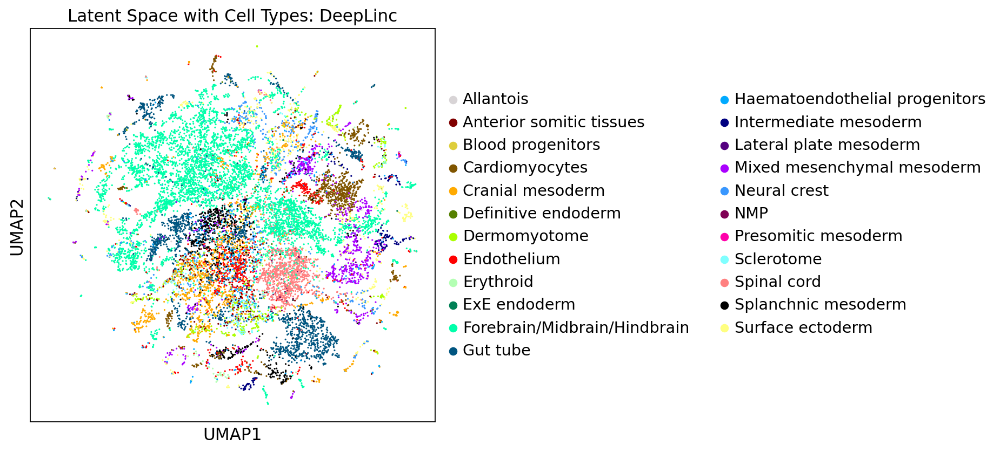

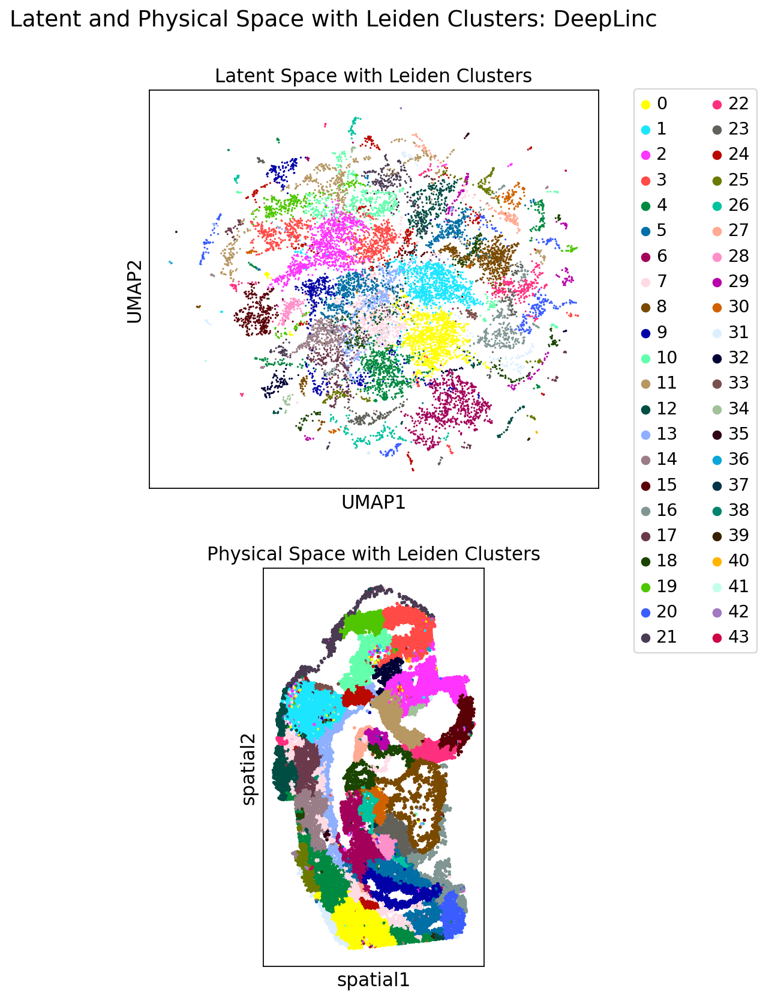

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


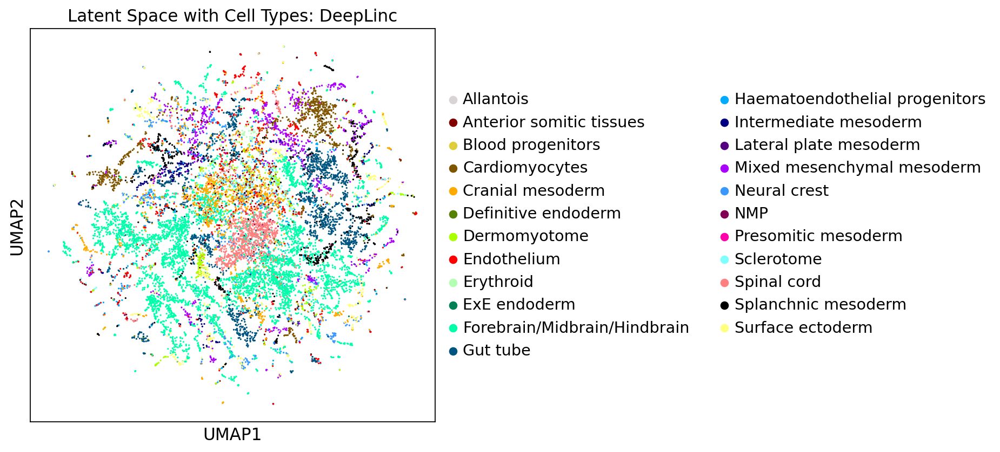

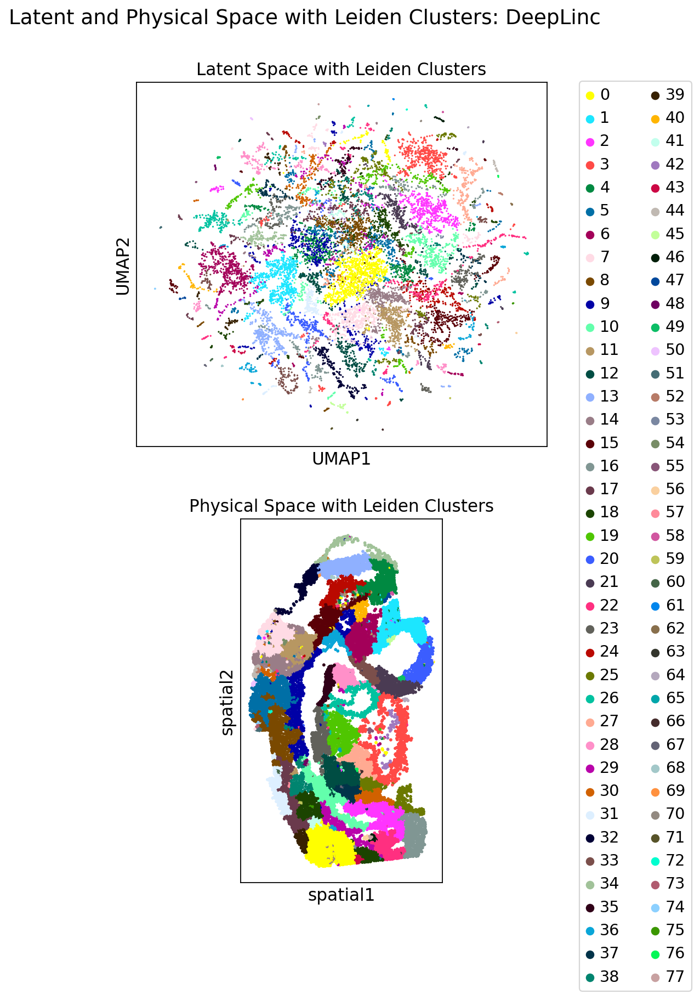

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


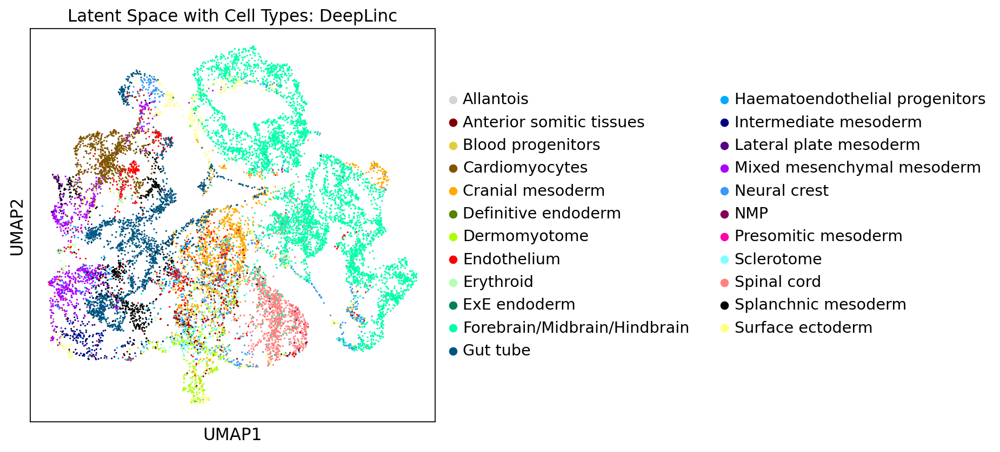

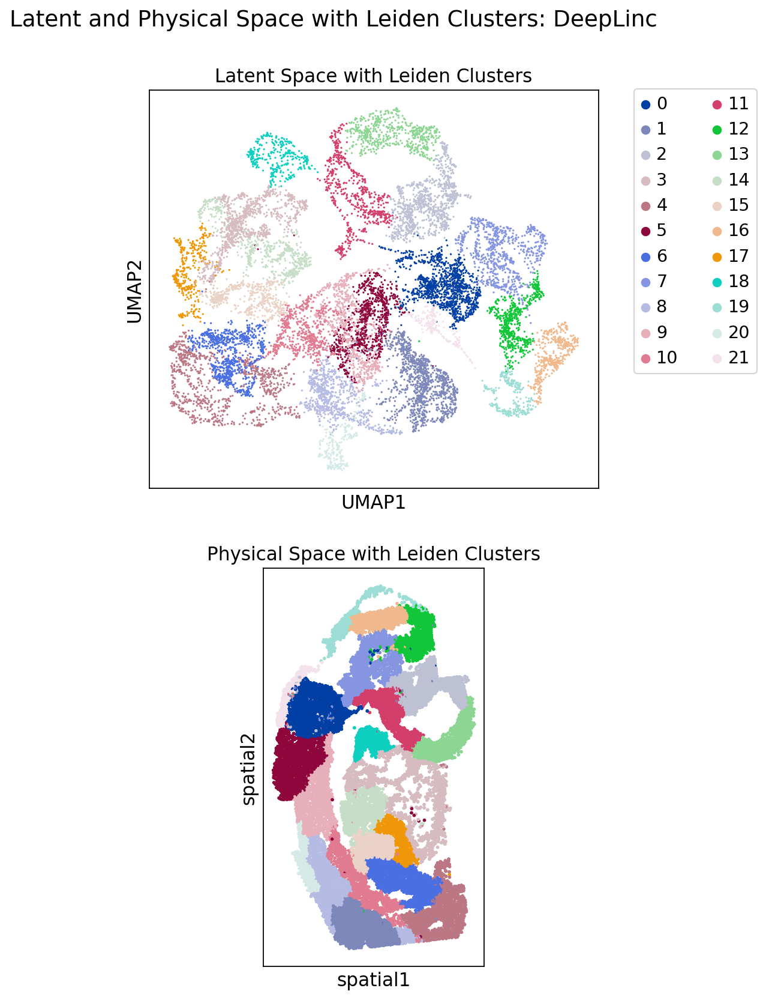

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


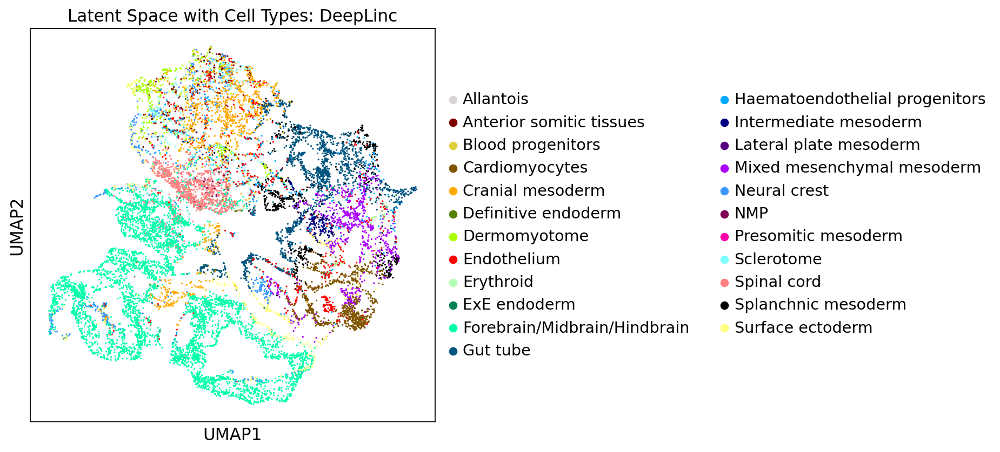

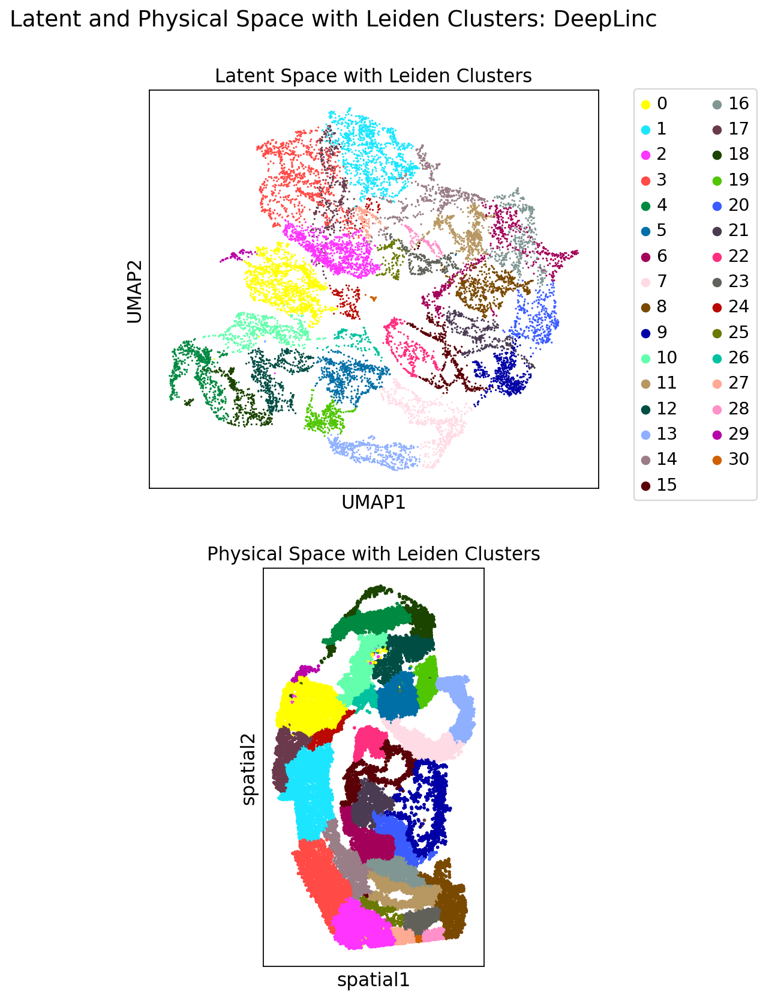

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


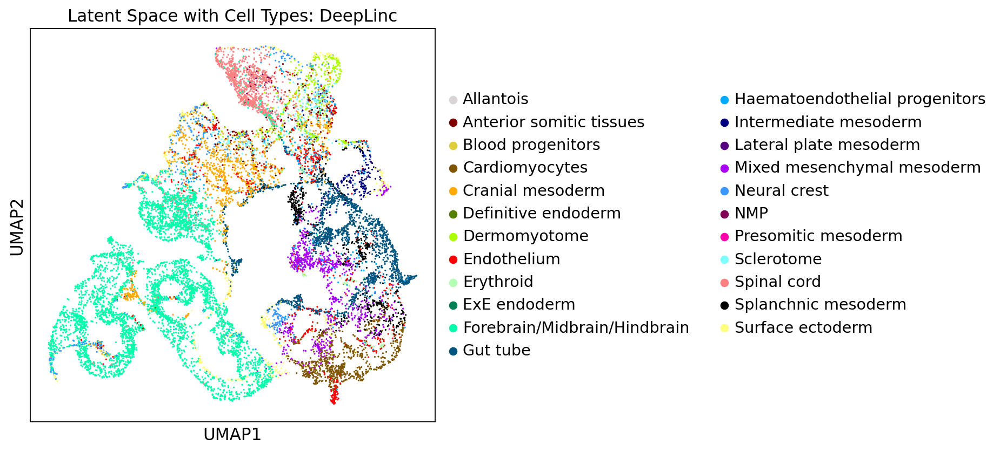

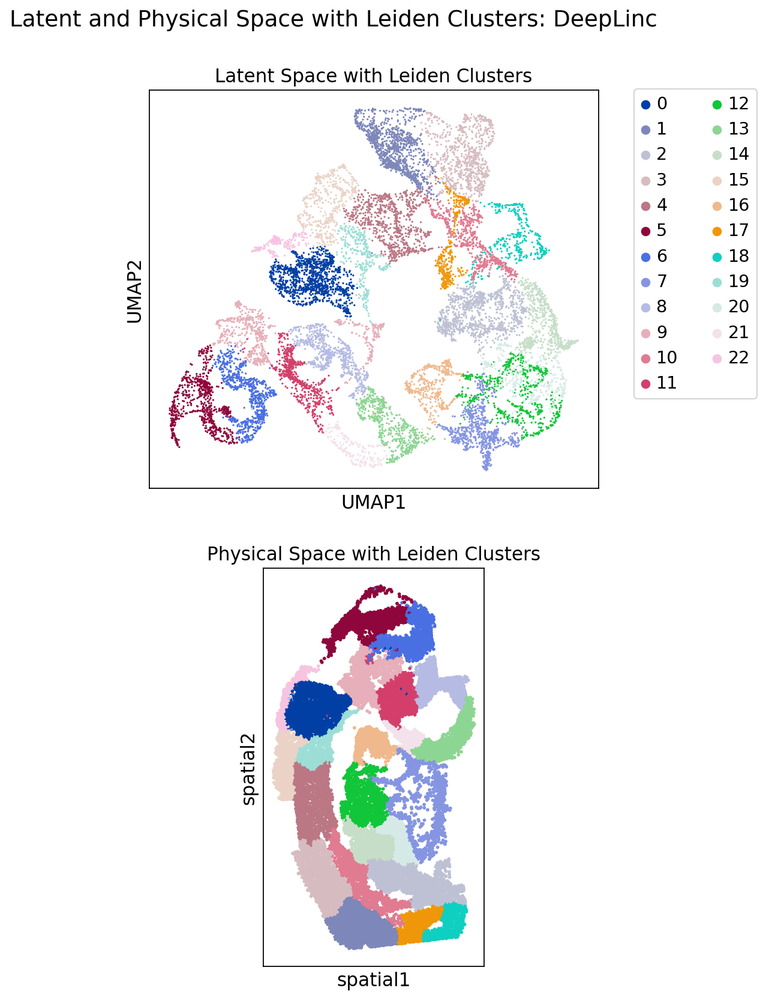

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


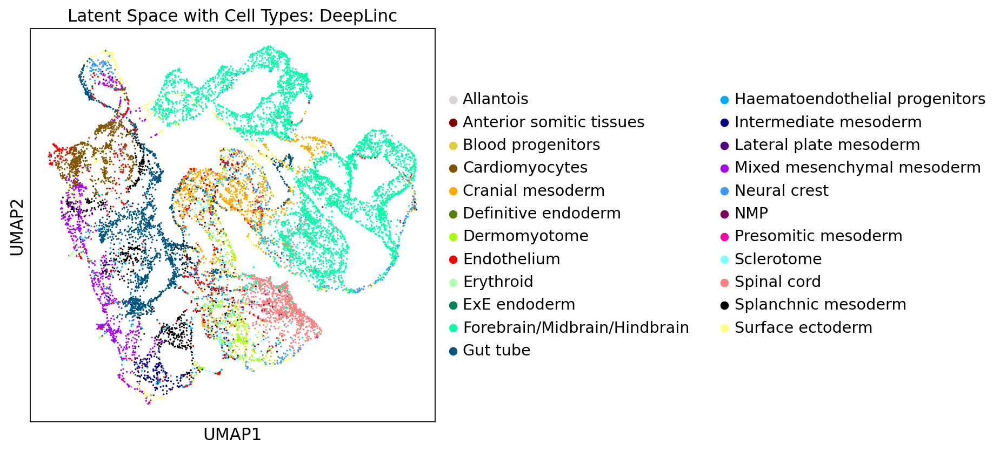

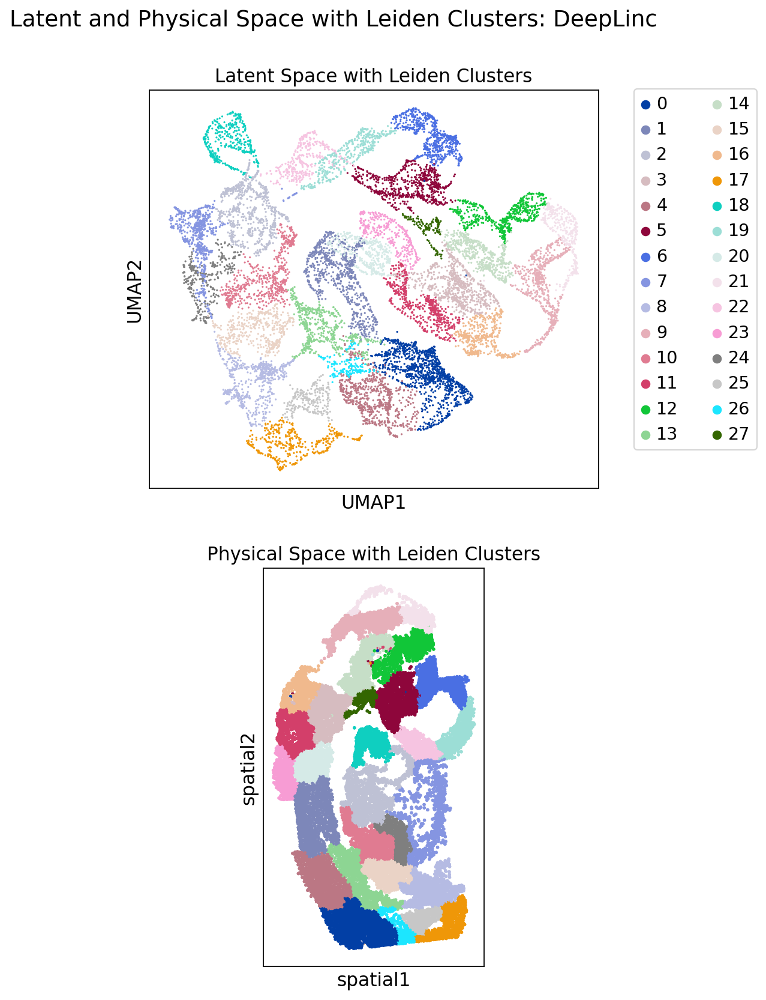

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


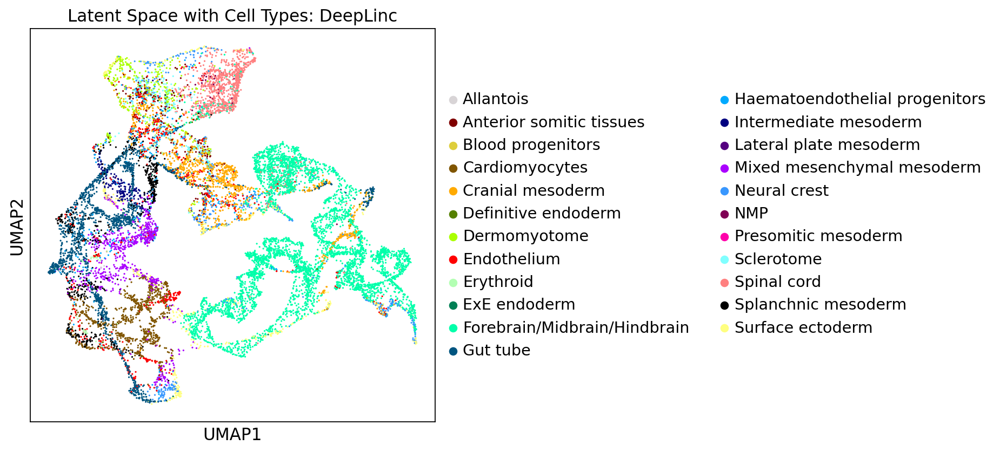

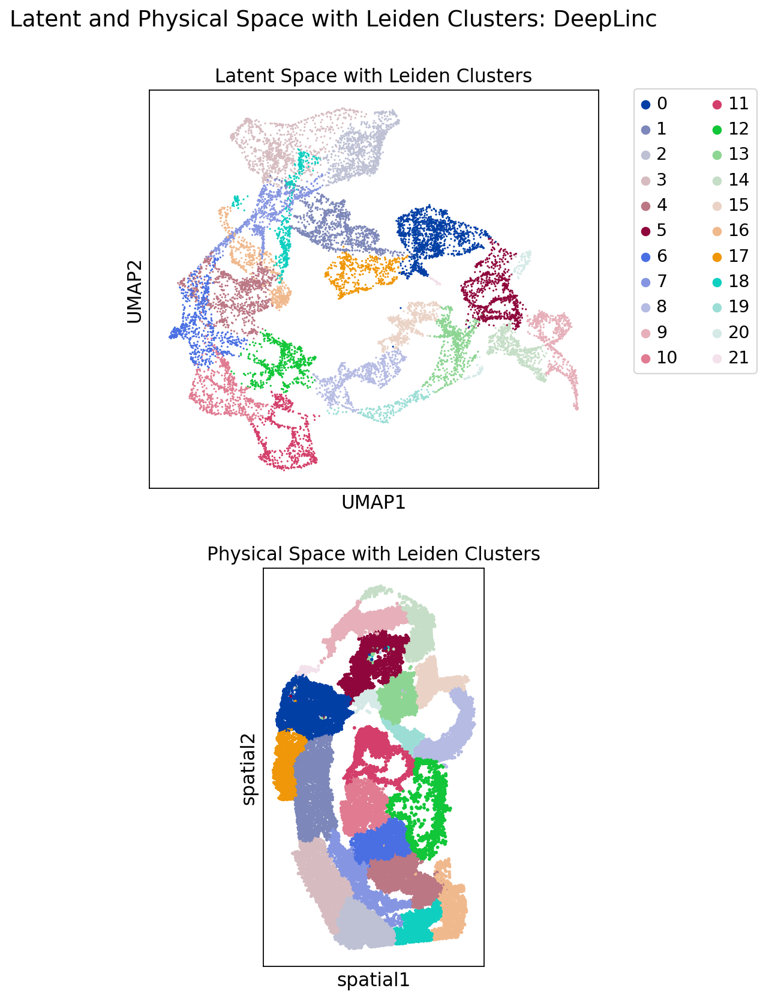

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


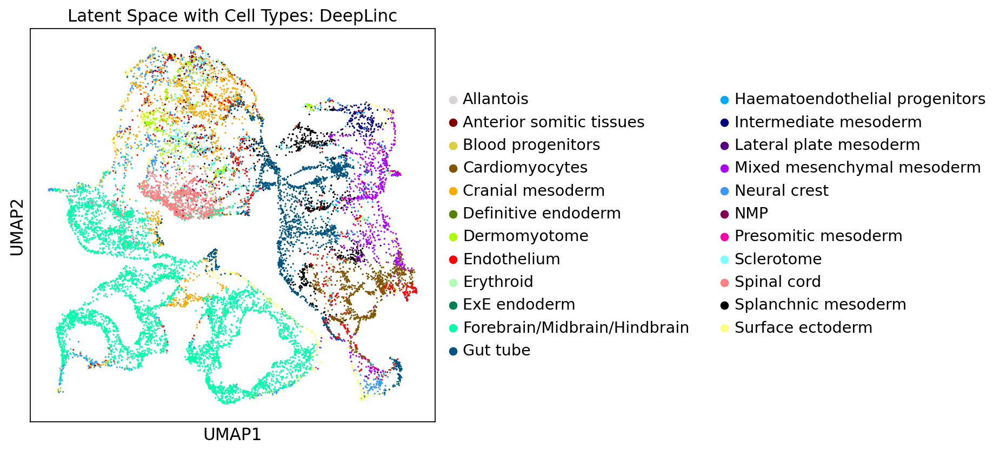

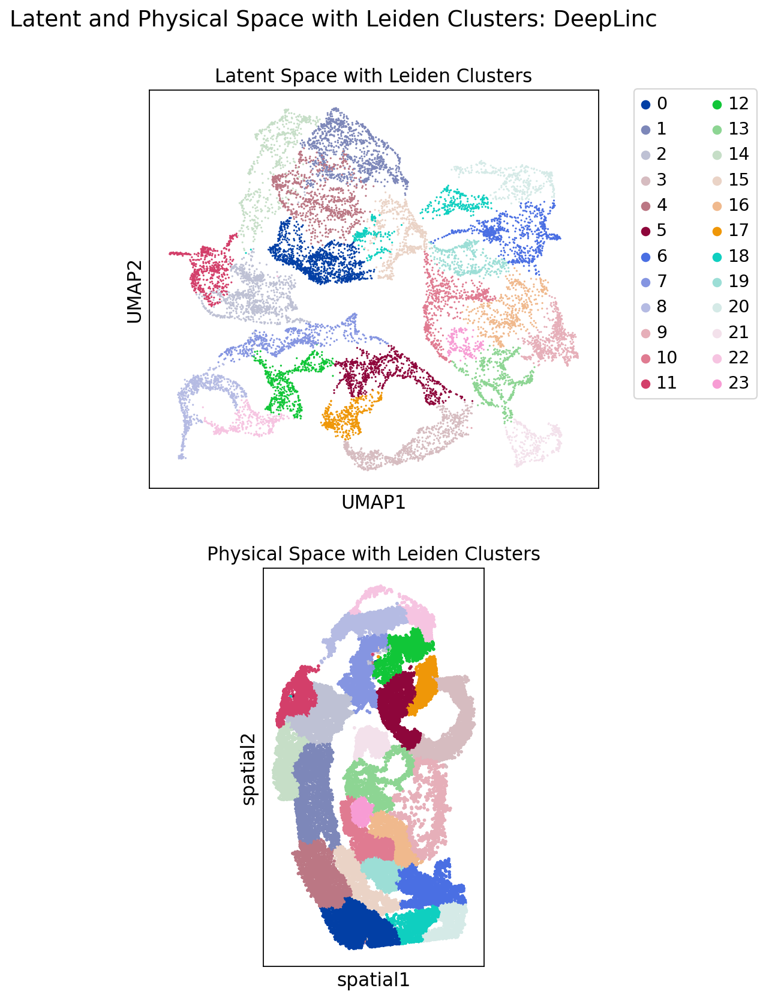

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


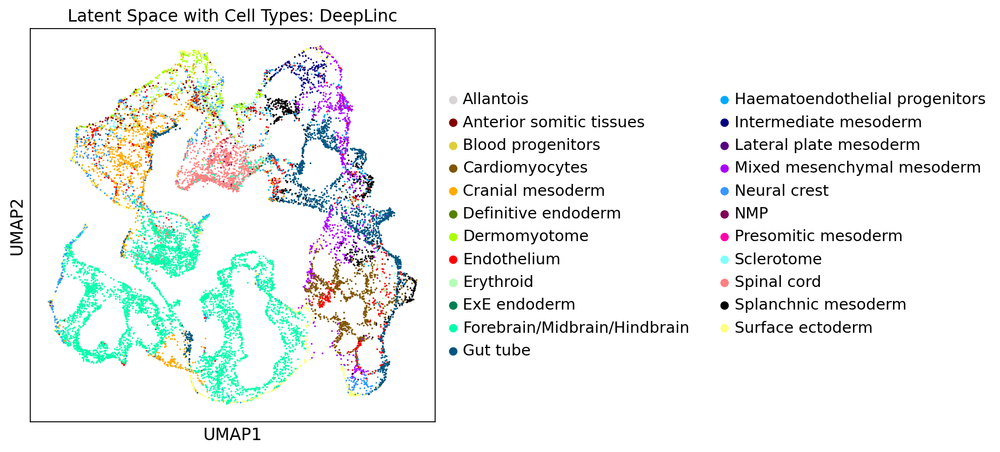

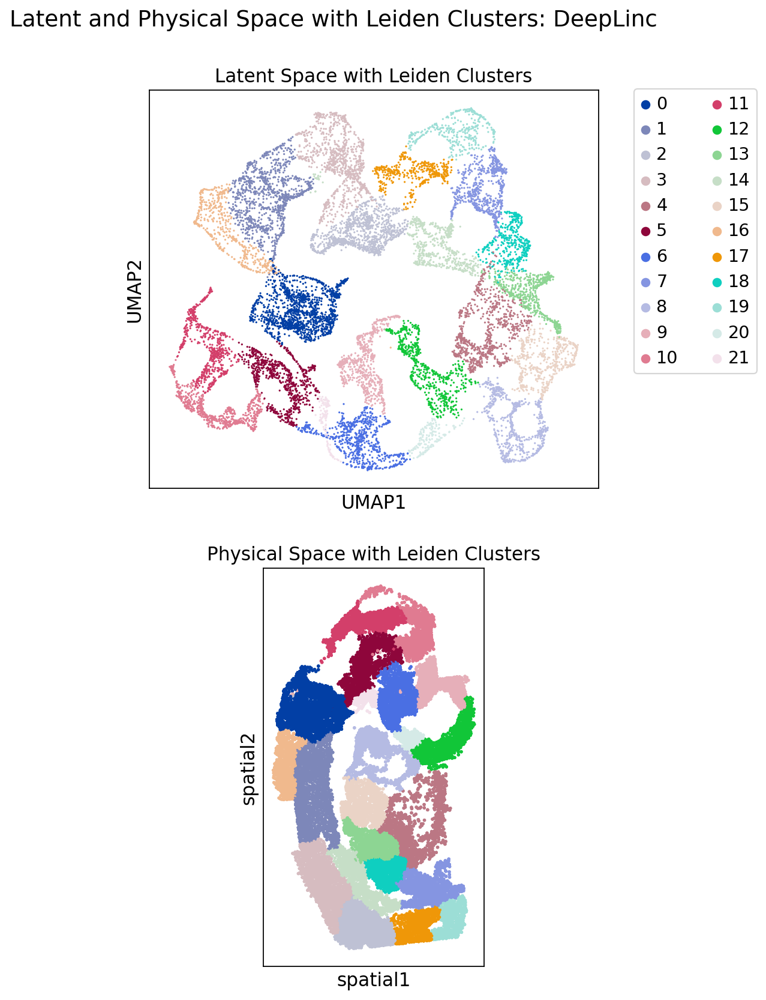

/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/sbirk/miniconda3/envs/autotalker/lib/python3.9/site-packages/squidpy/pl/_spatial_utils.py:955: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


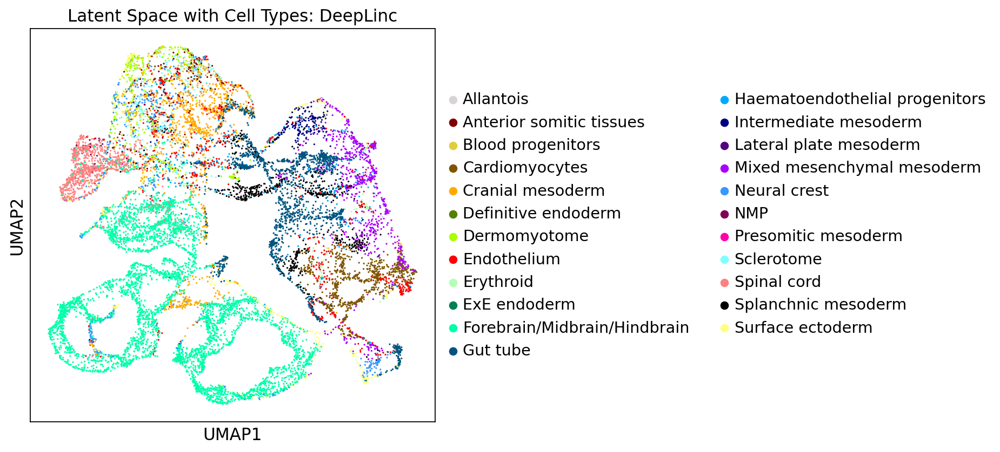

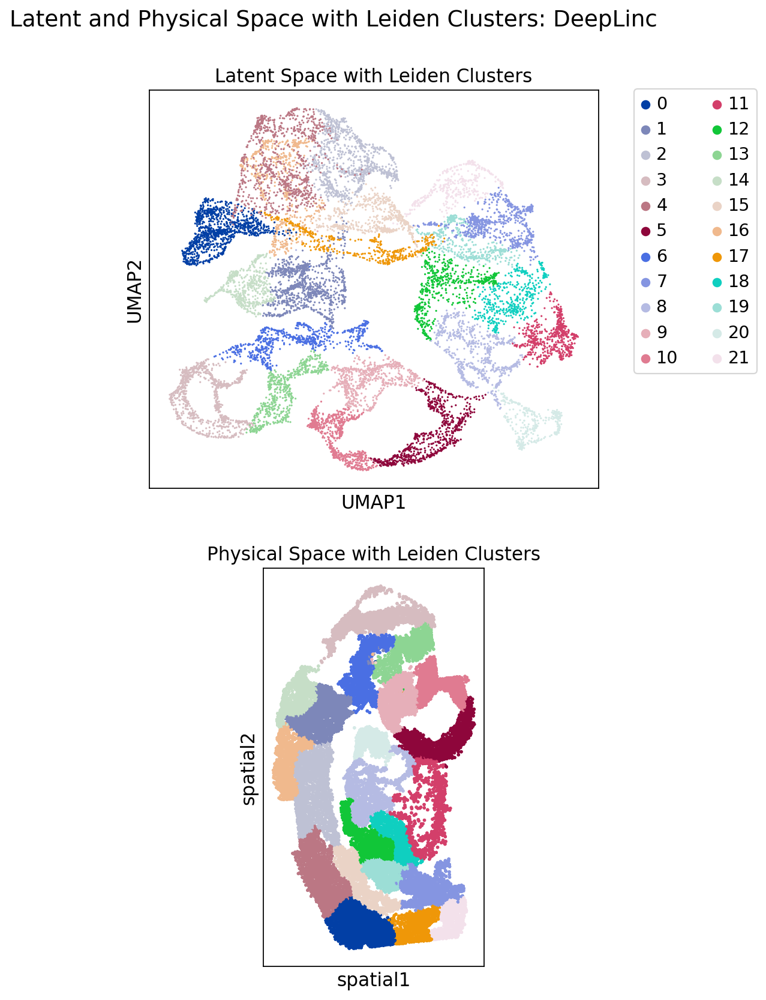

In [12]:
get_deeplinc_latent(dataset="seqfish_mouse_organogenesis_embryo2",
                    cell_type_key="celltype_mapped_refined")

In [ ]:
get_deeplinc_latent(dataset="vizgen_merfish_mouse_liver",
                    cell_type_key="Cell_Type")

In [ ]:
get_deeplinc_latent(dataset="starmap_plus_mouse_cns",
                    cell_type_key="Main_molecular_cell_type")

In [ ]:
get_deeplinc_latent(dataset="nanostring_cosmx_human_nsclc",
                    cell_type_key="cell_type")